# CSE327 Homework 1
**Due date: 11:59 pm on Sep 29, 2017 (Friday)**

## Prerequisite
---
* **Install Python**: you can download it at https://www.python.org/downloads/ or use Anaconda (a Python distribution) at https://docs.continuum.io/anaconda/install/. Please use Python of version 2.7.x because some of the packages we use may not support the latest version of Python. Below are some materials and tutorials which you may find useful for learning Python if you are new to Python.
  - https://docs.python.org/2.7/
  - https://www.learnpython.org/
  - http://docs.opencv.org/3.0-beta/doc/py_tutorials/py_tutorials.html
  - http://www.scipy-lectures.org/advanced/image_processing/index.html


* **Install Python packages**: install Python packages: `numpy`, `matplotlib`, `opencv-python` using pip, for example:
```
pip install numpy matplotlib opencv-python
``` 
Sometimes you may need to use command `pip2` instead of `pip`


* **Install Jupyter Notebook**: follow the instruction at http://jupyter.org/install.html to install Jupyter Notebook and get yourself familiar with it. *After you have installed Python and Jupyter Notebook, please open the notebook file 'HW1.ipynb' with your Jupyter Notebook and do your homework there.*


## Example
---
Before you get down to do your homework, please read through the following example where we apply image thresholding to an image. This example uses OpenCV as the image processing toolkit, you are free to use other toolkit at your convenience.

In [4]:
# import packages
import cv2 # for the convolution
import numpy as np 
import matplotlib.pyplot as plt # for plotting
import math # for math manipulations and constant values such as e and pi
import matplotlib.cm as cm # for colors
from mpl_toolkits.mplot3d import Axes3D # for 3D plot

from IPython.display import display, Image


print ('OpenCV version = ' + cv2.__version__)

OpenCV version = 3.3.0


In [4]:
# function for image thresholding
def imThreshold(img, threshold, maxVal):
    assert len(img.shape) == 2 # input image has to be gray
    
    height, width = img.shape
    bi_img = np.zeros((height, width), dtype=np.uint8)
    for x in xrange(height):
        for y in xrange(width):
            if img.item(x, y) > threshold:
                bi_img.itemset((x, y), maxVal)
                
    return bi_img
            

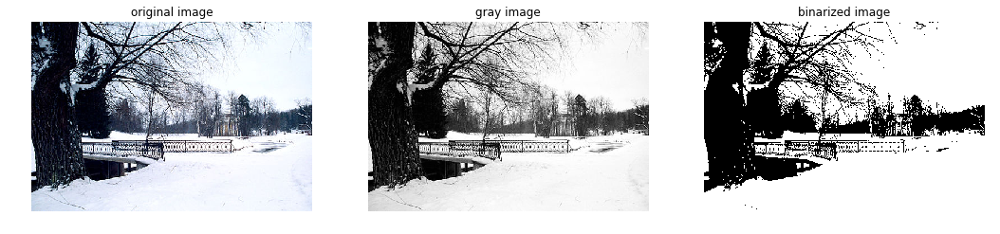

In [5]:
# read the image for local directory (same with this .ipynb) 
img = cv2.imread('snow.jpg')

# convert a color image to gray
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# image thresholding using global tresholder
img_bi = imThreshold(img_gray, 127, 255)

# Be sure to convert the color space of the image from
# BGR (Opencv) to RGB (Matplotlib) before you show a 
# color image read from OpenCV
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('original image')
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(img_gray, 'gray')
plt.title('gray image')
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(img_bi, 'gray')
plt.title('binarized image')
plt.axis("off")

plt.show()

## Description
---
In this homework you will work on basic image processing using Python. Be sure your Python has Image Processing Toolbox (OpenCV for example). However, for this homework do not use OpenCV unless explicitly instructed to. Download the image files (hw1_images.tgz) from Blackboard into your directory and then load image files using OpenCV with the imread command (see above example), and make sure to set your Jupyter Notebook’s current directory to the directory containing the file. Please do use relative path for this homework. 

There are seven images in total. The lena-noise.bmp is the same as the lena.bmp but corrupted with Gaussian noise. The barbara_noise.bmp is similarly corrupted barbara.bmp, and mandrill_noise.bmp is corrupted mandrill.bmp.

## Problems
---
- **Problem 1 {15 pts}:** Write a function in Python that takes two arguments, a width parameter, w, and a variance parameter, s, and returns a 2D array containing a Gaussian kernel of the desired dimension and variance. The peak of the Gaussian should be in the center of the array. Make sure to normalize the kernel such that the sum of all the elements in the array is 1. Use this function and the OpenCV’s `filter2D` routine to convolve the lena and lena_noise arrays with a 5 by5 Gaussian kernel with sigma of 1. Repeat with a 11 by 11 Gaussian kernel with a sigma of 3. Comment on the difference between the two images. Try the same thing to road and road_noise, barbara and barbara_noise, and to mandrill and mandrill_noise. Include your code and results in your Jupyter Notebook file.

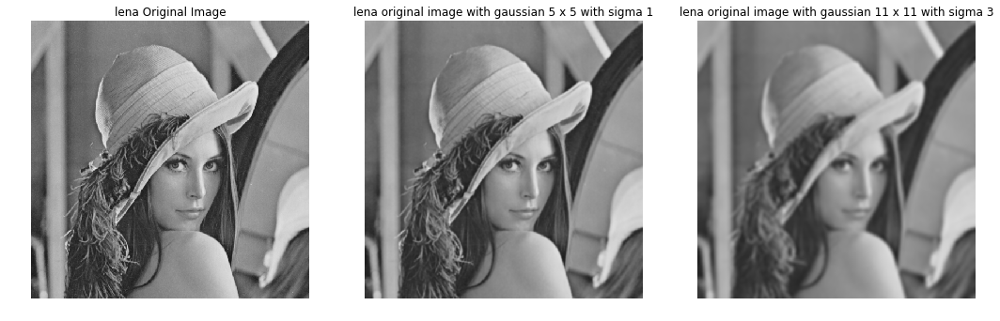

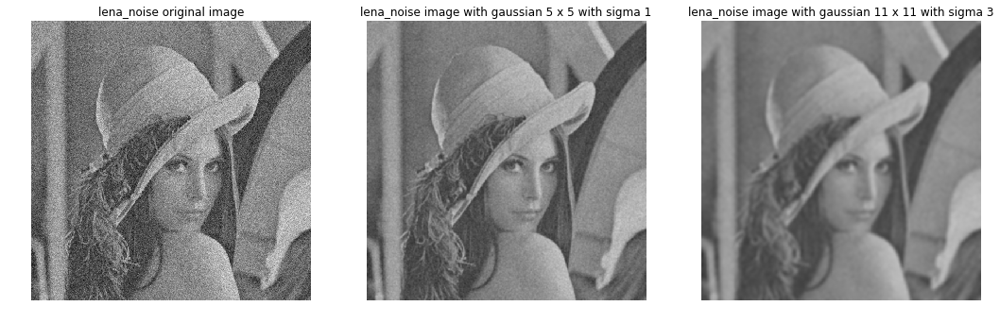

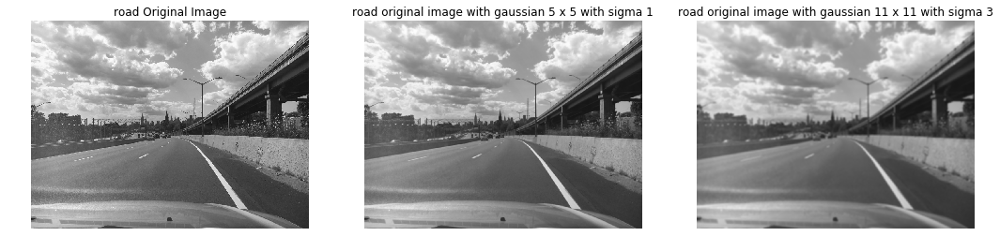

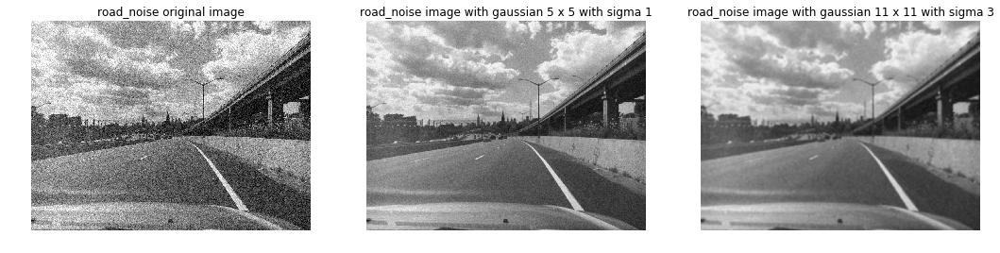

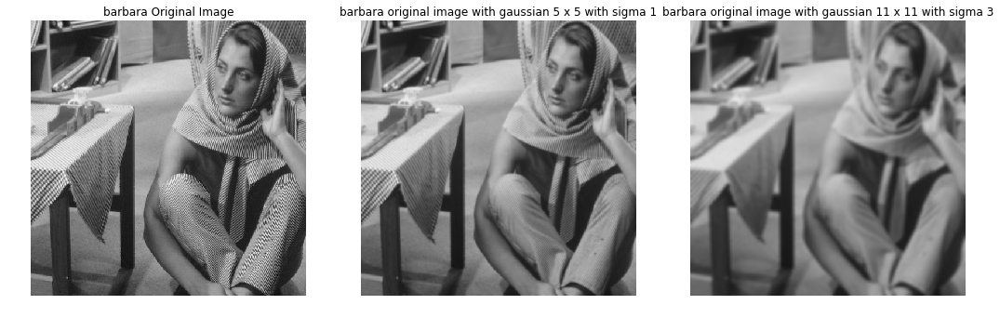

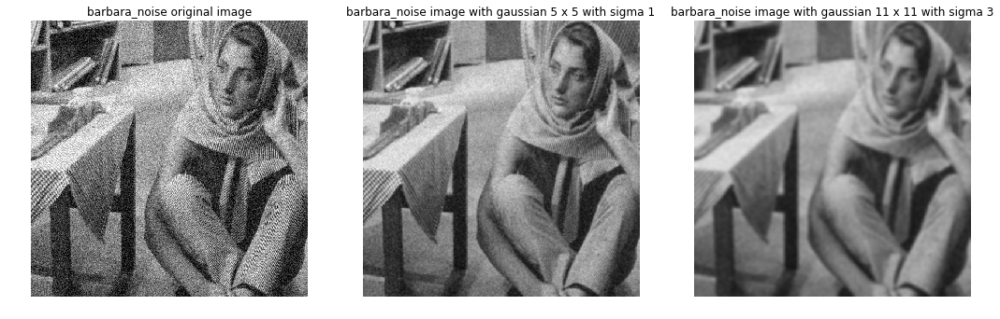

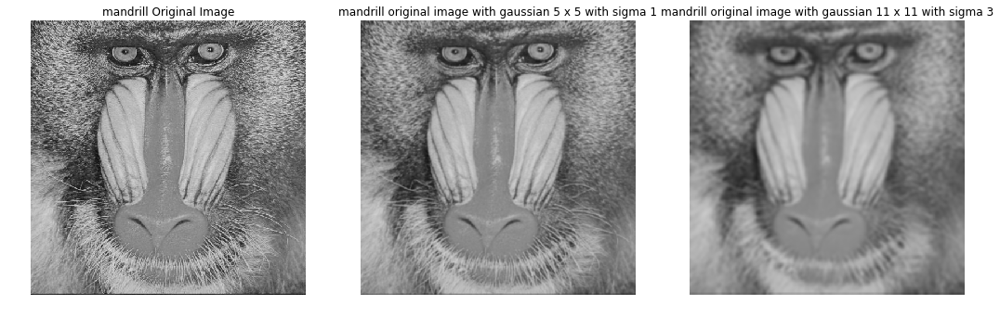

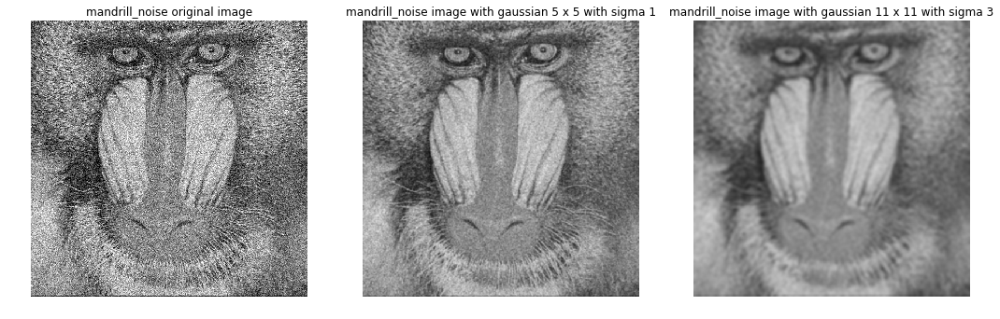

In [78]:
# Answer of Problem 1

# function for mean kernal
# just for practice
def getMeanKernel(w):
    arr = []
    total = w*w
    for x in range(0,w):
        arr.append([])
        for y in range(0,w):
            arr[x].append(float(1.0/total))
    return np.array(arr)

# function for Gaussian Kernal
def getGaussianKernel(w, s):
    arr = []
    half = w/2 # to know the highest and lowest value of the array
    for x in range(-half,half+1):
        arr.append([])
        for y in range(-half,half+1):
            g =  math.exp((-(math.pow(x,2)+math.pow(y,2))/(2.0*math.pow(s,2))))
            arr[x+half].append(g)
    sumG = np.sum(arr) # sum of the array
    
    #dividing all by sum to normalise it
    for x in range(0,w):
        for y in range(0,w):
            arr[x][y] = arr[x][y]/sumG
    return np.array(arr) # return the gaussian

# looping over the pictures
arr_img = ['lena','road','barbara','mandrill']

# saving the gaussians 
gau_5_1 = getGaussianKernel(5,1)
gau_11_3 = getGaussianKernel(11,3)

for x in arr_img:
    # showing the blurred images for the originaal image
    img = cv2.imread(x + '.bmp')
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(x + ' Original Image')
    plt.axis("off")

    #width =  5, sigma = 1
    outImg = cv2.filter2D(img, -1, gau_5_1)
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(outImg, cv2.COLOR_BGR2RGB))
    plt.title(x + ' original image with gaussian 5 x 5 with sigma 1')
    plt.axis("off")
    
    #width =  11, sigma = 3
    outImg = cv2.filter2D(img, -1, gau_11_3)
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(outImg, cv2.COLOR_BGR2RGB))
    plt.title(x + ' original image with gaussian 11 x 11 with sigma 3')
    plt.axis("off")
    plt.show()

    # showing the blurred images for the image with noise
    img_noise =  cv2.imread(x + '_noise.bmp')
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img_noise, cv2.COLOR_BGR2RGB))
    plt.title(x + '_noise original image')
    plt.axis("off")

    #width =  5, sigma = 1
    outImg = cv2.filter2D(img_noise, -1, gau_5_1)
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(outImg, cv2.COLOR_BGR2RGB))
    plt.title(x + '_noise image with gaussian 5 x 5 with sigma 1')
    plt.axis("off")


    #width =  11, sigma = 3
    outImg = cv2.filter2D(img_noise, -1, gau_11_3)
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(outImg, cv2.COLOR_BGR2RGB))
    plt.title(x + '_noise image with gaussian 11 x 11 with sigma 3')
    plt.axis("off")
    plt.show()
    
    
# Here, the difference is that higher width leads to contribution of more neighbourhood pixels in the formation of new image. 
# Also, higher sigma means the width of the gaussian would be bigger. Which means that the weighted average 
# would be more distributed throughout the matrix. Thus the neighbourhood has more weighted contributions. 


- **Problem 2 {15 pts}:** The Gaussian kernel is separable, which means that convolution with a 2D Gaussian can be accomplished by convolving the image with two 1D Gaussian, one in the x direction and another in the y direction. Repeat the 2 convolutions you did in question 1 using this scheme. You can still use `filter2D` to convolve the images with each of the 1D kernels. Verify that you get the same results that you did in question 1 by computing the maximum difference between the arrays produced with the two methods. Include your code and results in your Jupyter Notebook file. (You don't have to turn in the images for this part)

The Kernel created from 2D is the same as Kernels created from combination of 1D 


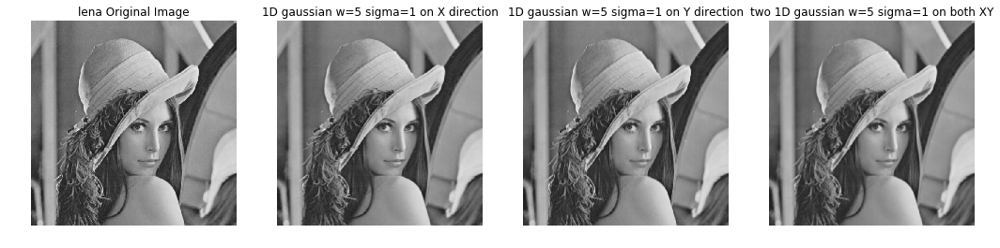

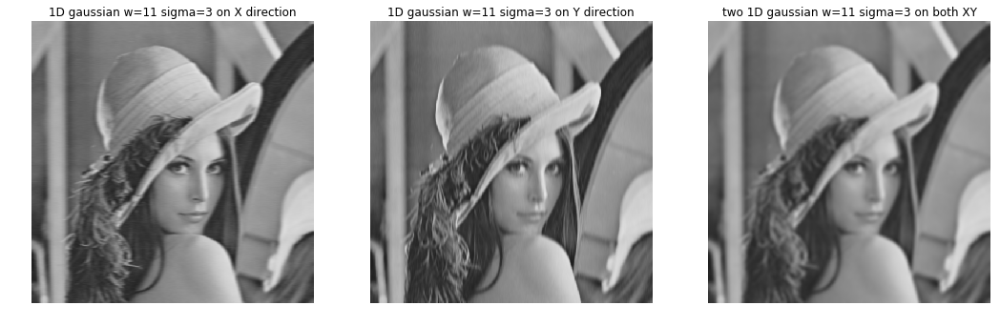

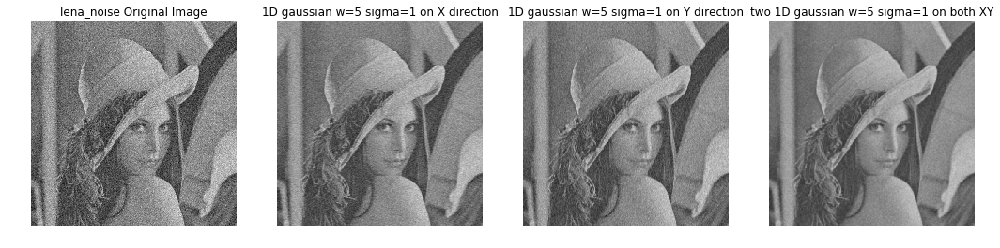

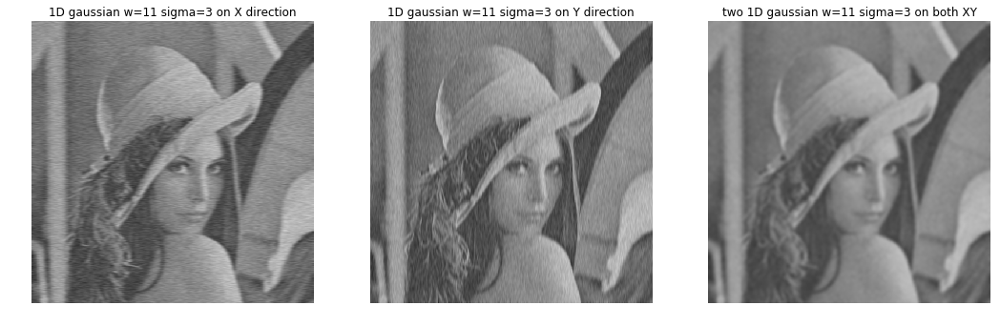

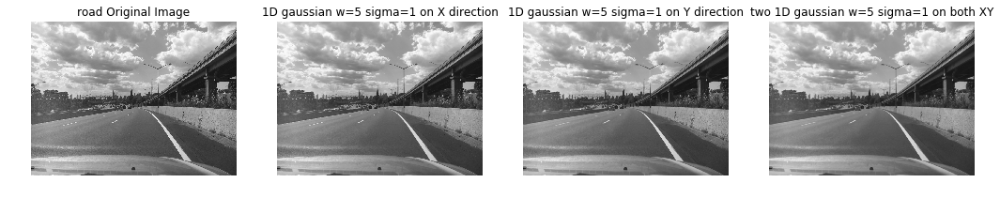

...

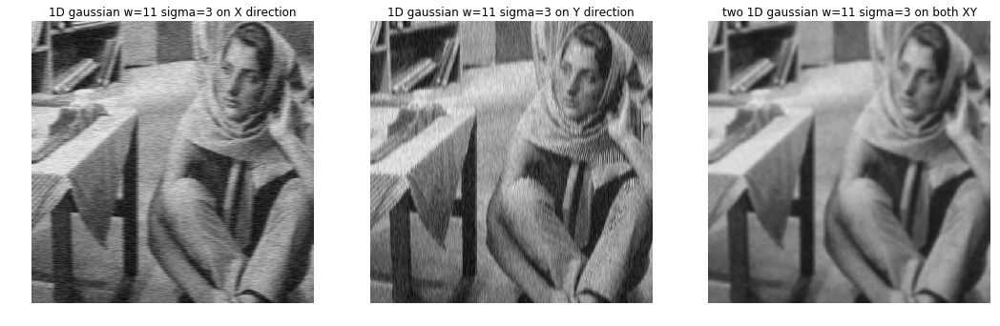

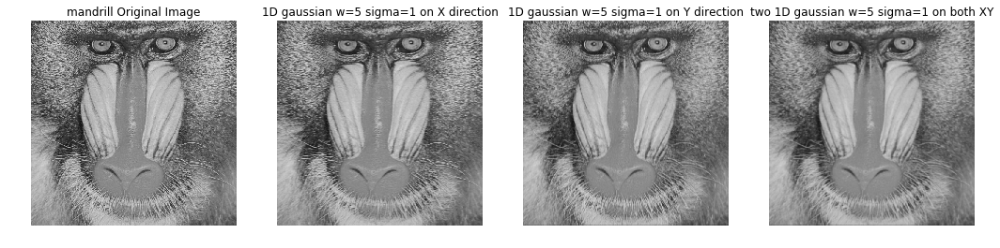

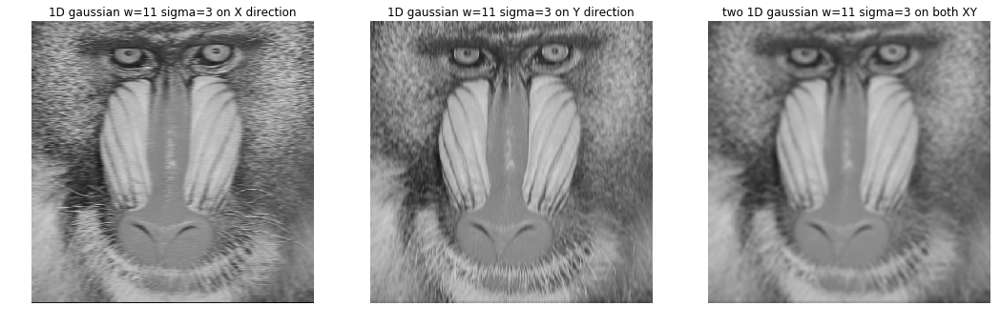

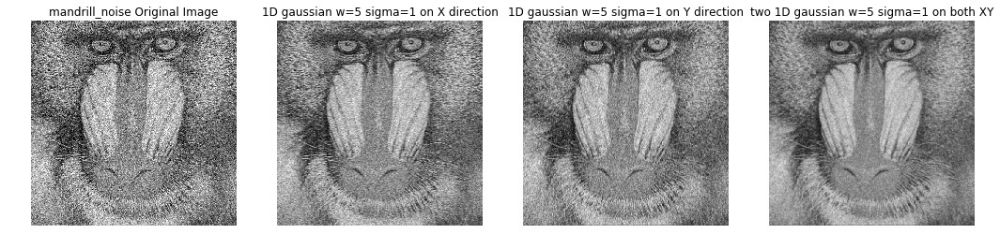

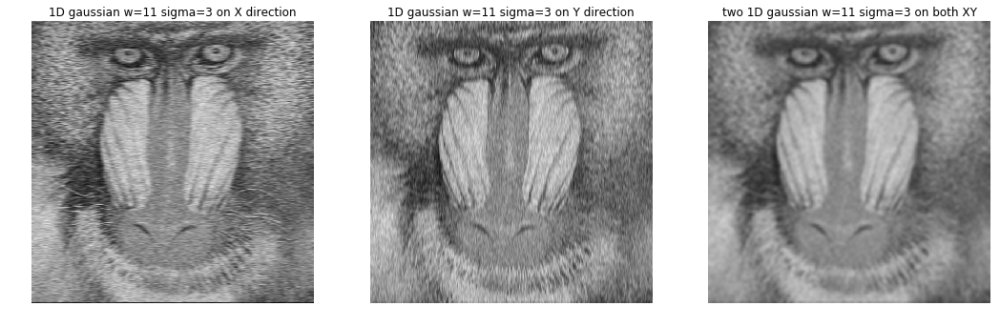

In [83]:
# Answer for Problem 2

# function for 1D x-direction Gaussian Kernal
def get1D_x_GaussianKernel(w, s):
    arr = []
    half = w/2
    for y in range(-half,half+1):
        g =  math.exp(-math.pow(y,2)/(2.0*math.pow(s,2)))
        arr.append(g)
    sumG = np.sum(arr)
    for y in range(0,w):
        arr[y] = arr[y]/sumG
    
    return np.reshape(np.array(arr), (1, w))
     

# function for 1D y-direction Gaussian Kernal
def get1D_y_GaussianKernel(w, s):
    arr = []
    half = w/2
    for y in range(-half,half+1):
        arr.append([])
        g =  math.exp(-math.pow(y,2)/(2.0*math.pow(s,2)))
        arr[y+half].append(g)
    sumG = np.sum(arr)
    for y in range(0,w):
        arr[y] = arr[y]/sumG
    return np.array(arr)

#computing the Kernels
gau_kernel_x_5_1 = get1D_x_GaussianKernel(5, 1)
gau_kernel_y_5_1 = get1D_y_GaussianKernel(5, 1)
gau_kernel_x_11_3 = get1D_x_GaussianKernel(11, 3)
gau_kernel_y_11_3 = get1D_y_GaussianKernel(11, 3)


#Checking if the kernels match   

#getting the kernel itself
gau_1D_combined_5_1 = cv2.filter2D(gau_kernel_x_5_1, -1, gau_kernel_y_5_1)
gau_1D_combined_11_3 = cv2.filter2D(gau_kernel_x_11_3, -1, gau_kernel_y_11_3)

#checking
if ((gau_1D_combined_5_1.all() == gau_5_1.all()) and (gau_1D_combined_11_3.all() == gau_11_3.all())):
    print "The Kernel created from 2D is the same as Kernels created from combination of 1D "
else:
    print "The Kernel created from 2D is NOT the same as Kernels created from combination of 1D "


#Displaying the images
arr_img = ['lena','lena_noise','road','road_noise','barbara','barbara_noise','mandrill','mandrill_noise']

for x in arr_img:
    img = cv2.imread(x + '.bmp')
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 4, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(x + ' Original Image')
    plt.axis("off")
    
    
    #width =  5, sigma = 1
    xImg = cv2.filter2D(img, -1, gau_kernel_x_5_1)
    plt.subplot(1, 4, 2)
    plt.imshow(cv2.cvtColor(xImg, cv2.COLOR_BGR2RGB))
    plt.title('1D gaussian w=5 sigma=1 on X direction')
    plt.axis("off")
    
    #width =  5, sigma = 1
    yImg = cv2.filter2D(img, -1, gau_kernel_y_5_1)
    plt.subplot(1, 4, 3)
    plt.imshow(cv2.cvtColor(yImg, cv2.COLOR_BGR2RGB))
    plt.title('1D gaussian w=5 sigma=1 on Y direction')
    plt.axis("off")
    
    #width =  5, sigma = 1
    xyImg = cv2.filter2D(xImg, -1, gau_kernel_y_5_1)
    plt.subplot(1, 4, 4)
    plt.imshow(cv2.cvtColor(xyImg, cv2.COLOR_BGR2RGB))
    plt.title('two 1D gaussian w=5 sigma=1 on both XY')
    plt.axis("off")
    plt.show()
    
    
    #width =  11, sigma = 3
    plt.figure(figsize=(18, 6))
    xImg = cv2.filter2D(img, -1, gau_kernel_x_11_3)
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(xImg, cv2.COLOR_BGR2RGB))
    plt.title('1D gaussian w=11 sigma=3 on X direction')
    plt.axis("off")
    
    
    #width =  11, sigma = 3
    yImg = cv2.filter2D(img, -1, gau_kernel_y_11_3)
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(yImg, cv2.COLOR_BGR2RGB))
    plt.title('1D gaussian w=11 sigma=3 on Y direction')
    plt.axis("off")
    
    
    #width =  11, sigma = 3
    xyImg = cv2.filter2D(xImg, -1, gau_kernel_y_11_3)
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(xyImg, cv2.COLOR_BGR2RGB))
    plt.title('two 1D gaussian w=11 sigma=3 on both XY')
    plt.axis("off")
    plt.show()



- **Problem 3 {15 pts}:** Implement in Python the Sobel edge detector and apply it to the input image building.bmp. Then apply an appropriate threshold to the edge strength values to select what you think are the most important edges. Include your code and results in your Jupyter Notebook file.



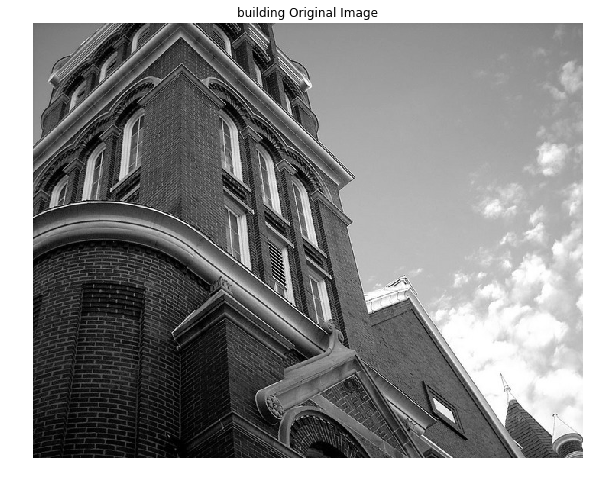

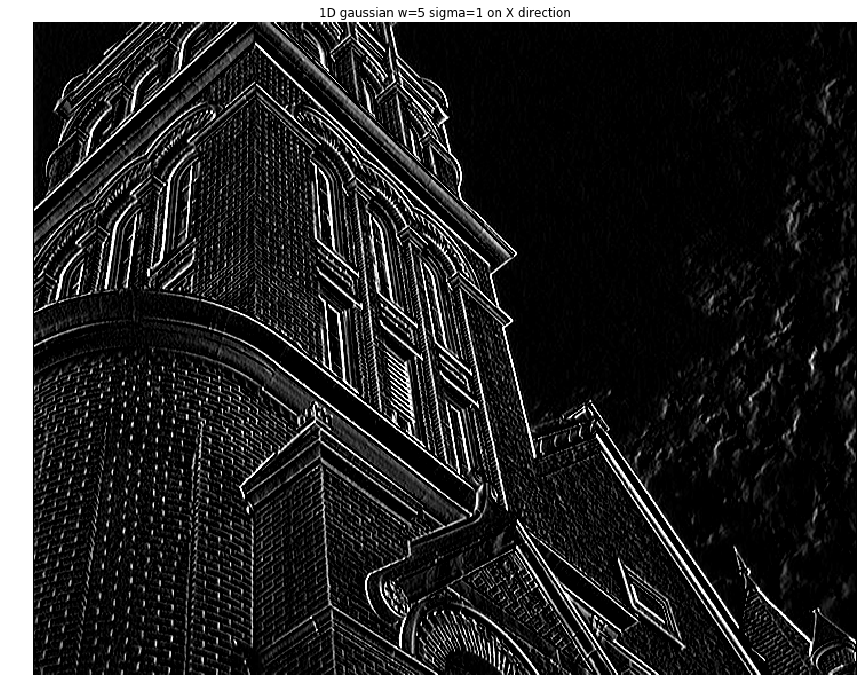

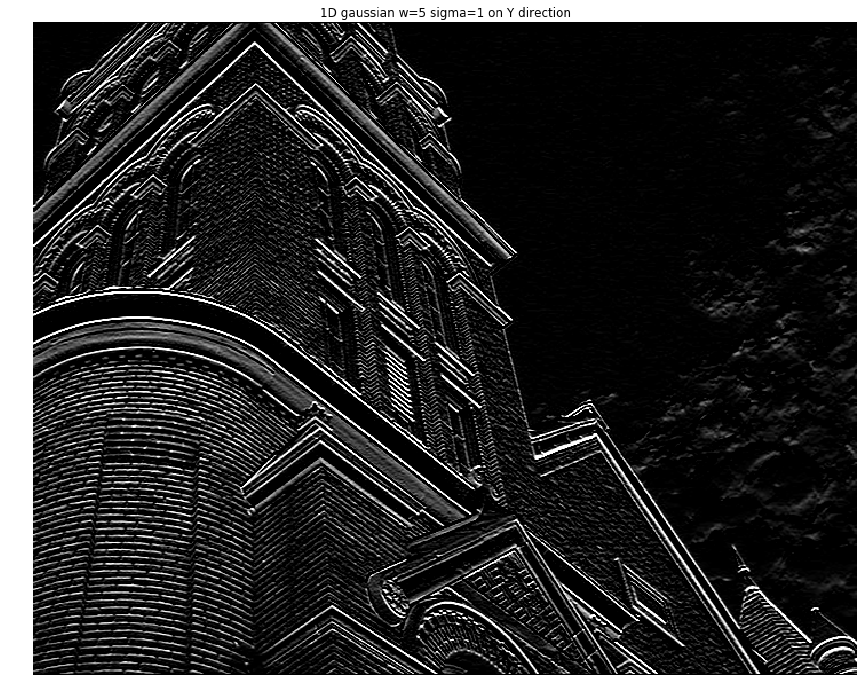

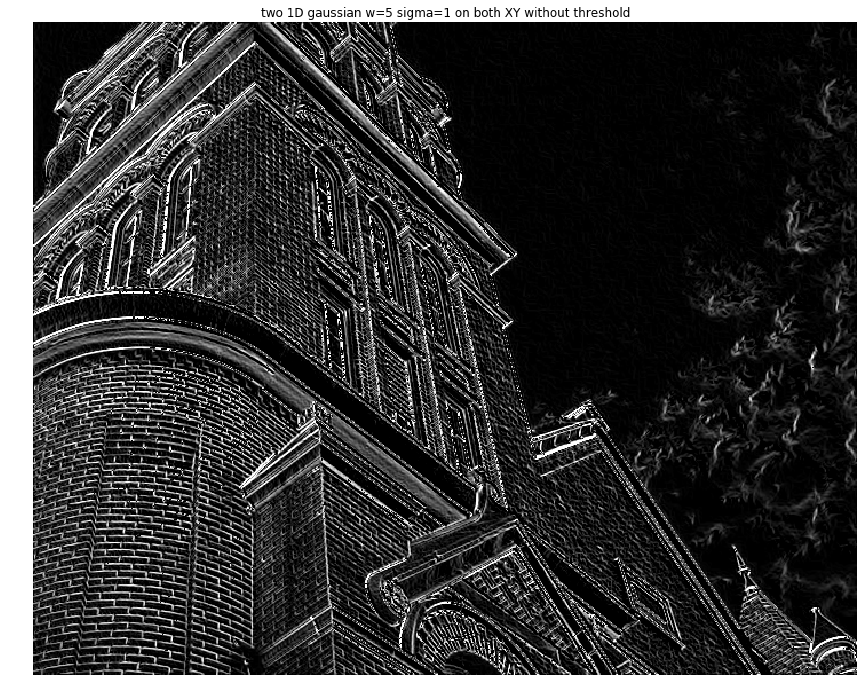

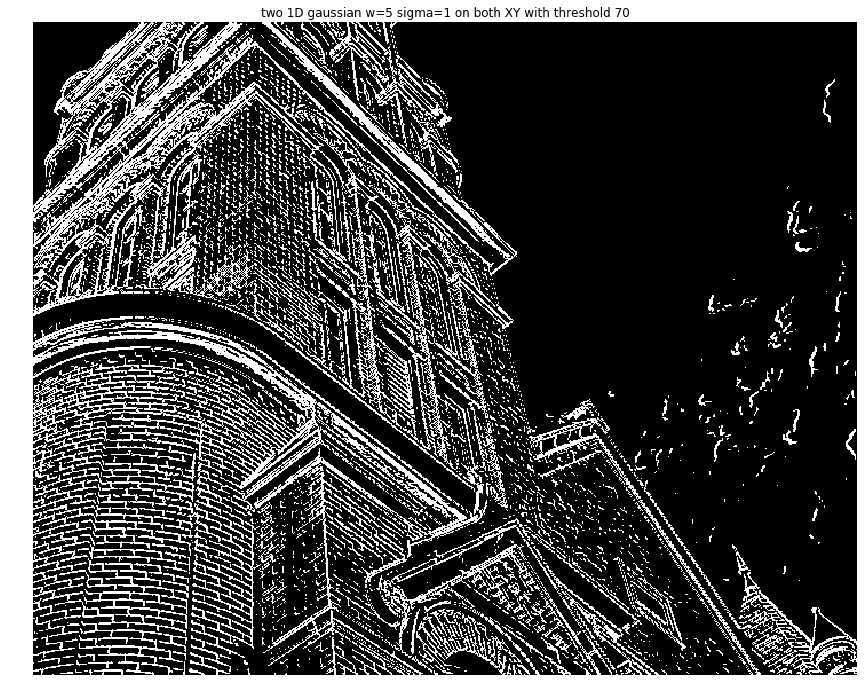

In [102]:
# write your code for Problem 3 here

# For a Sobel Edge detector, we usually greyscale the image first, then use a small Gaussian filter 
# and then only use the Sobel operator
# here we are not doing that

# Creating the Sobel Filter
sobel_X = np.array([[-1, 0, 1],[ -2, 0, 2],[ -1, 0, 1]])
sobel_Y = np.array([[1, 2, 1],[ 0, 0, 0],[ -1, -2, -1]])

# just add the images in this array that you want to loop over here
arr_img = ['building']

for x in arr_img:
    #printing the original image
    img = cv2.imread(x + '.bmp', 0)
    plt.figure(figsize=(36, 8))
    plt.imshow(img, 'gray')
    plt.title(x + ' Original Image')
    plt.axis("off")
    plt.show()

    #Applying sobel in the X direction
    plt.figure(figsize=(54, 12))
    xImg = cv2.filter2D(img, -1, sobel_X)
    plt.imshow(xImg, 'gray')
    plt.title('1D gaussian w=5 sigma=1 on X direction')
    plt.axis("off")
    plt.show()
    
    #Applying sobel in the Y direction
    plt.figure(figsize=(54, 12))
    yImg = cv2.filter2D(img, -1, sobel_Y)
    plt.imshow(yImg, 'gray')
    plt.title('1D gaussian w=5 sigma=1 on Y direction')
    plt.axis("off")
    plt.show()

    # Here the xImg and yImg was is in uint8 but it exceeds the bounds while power and sqrt makes it smaller
    # so we need to cast appropriately
    # Finding the Magnitude of the Sobel
    sobel_XY = np.sqrt(xImg.astype(np.float32)**2 + yImg.astype(np.float32)**2)
    xyImg = sobel_XY.astype(np.uint8)

    # Now we show the picture with the magnitude
    plt.figure(figsize=(54, 12))
    plt.imshow(xyImg, 'gray')
    plt.title('two 1D gaussian w=5 sigma=1 on both XY without threshold')
    plt.axis("off")
    plt.show()
    
    # Now we show the picture with the magnitude along with threshold
    plt.figure(figsize=(54, 12))
    plt.imshow(imThreshold(xyImg, 70, 255), 'gray')
    plt.title('two 1D gaussian w=5 sigma=1 on both XY with threshold 70')
    plt.axis("off")
    plt.show()

    

- **Problem 4 {5 pts}:** Convolve an 11 by 11 Gaussian of sigma = 1 with the discrete approximation to the Laplacian kernel (i.e., [0 1 0; 1 -4 1; 0 1 0] or [1 1 1; 1 -8 1; 1 1 1]). Plot this 2D function using the `Matplotlib` function `plot` . Turn in this 3D plot using the `Matplotlib` function `plot_surface`. Do you see why this is referred to as the Mexican hat filter? Include your code and results in your Jupyter Notebook file.



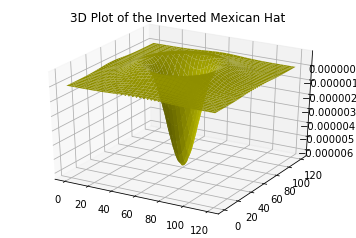

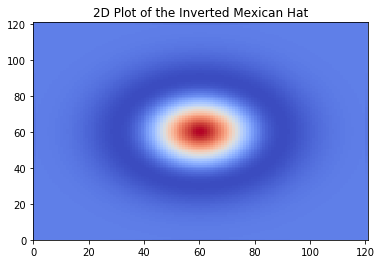

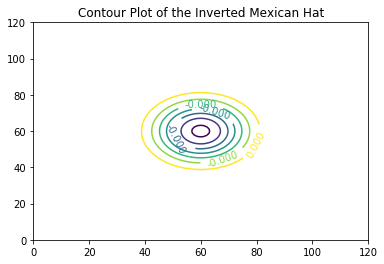

In [92]:
# write your code for Problem 4 here

# Here we can use either one of them
# For this exercise, we used the first one
laplacianKernel = np.array([[0, 1, 0],[ 1, -4, 1],[ 0, 1, 0]])
laplacianKernel2 = np.array([[1, 1, 1],[ 1, -8, 1],[ 1, 1, 1]])

# as the 2D plot would be too pixelated because of less width
# we change the width to 121 and sigma to be 15 so that the picture would look more smoother
# you can change them any time using the following variables
wid = 121
sig = 15

# First Calculate the Gaussian Kernel for the given width and sigma
gaussian = getGaussianKernel(wid,sig)

# Then Calculate the Laplacian of the Gaussian Kernel
gaussianLaplacianKernel = cv2.filter2D(gaussian, -1, laplacianKernel)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# getting the discrete values from the array range
# here the x and y would be the array indices of the 2D array of the Laplacian of Gaussian
# The Z value would the array value at those indicese
X = np.arange(0, wid, 1) 
Y = np.arange(0, wid, 1)
Z = gaussianLaplacianKernel[X][Y]
X, Y = np.meshgrid(X, Y) # creates the mesh
#plotting the surface
ax.plot_surface(X, Y, Z, color='y')
plt.title('3D Plot of the Inverted Mexican Hat')

plt.figure()
# getting the colors for the plot
cmap = cm.get_cmap('coolwarm_r') 
#plotting the 2D plot
cs = plt.pcolor(np.transpose(Z), cmap = cmap)
plt.title('2D Plot of the Inverted Mexican Hat')
plt.show()

# plotting a contour for the Laplacian of Gaussian
CS = plt.contour(X, Y, Z)
plt.clabel(CS, inline=1, fontsize=10)
plt.title('Contour Plot of the Inverted Mexican Hat')

plt.show()

- **Problem 5 {15 pts}:** Implement in Python an edge detector based on locating the zero crossings of the Laplacian. More specifically, write a routine that first convolves the input image with the Mexican hat kernel you produced in question 4 then searches the output array for locations where the value changes from positive to negative between neighboring pixels and the magnitude of the change is greater than some specified threshold. Test your program on the building image and find a threshold value which seems to yield acceptable results. Include your code and results in your Jupyter Notebook file.

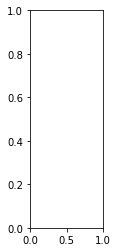

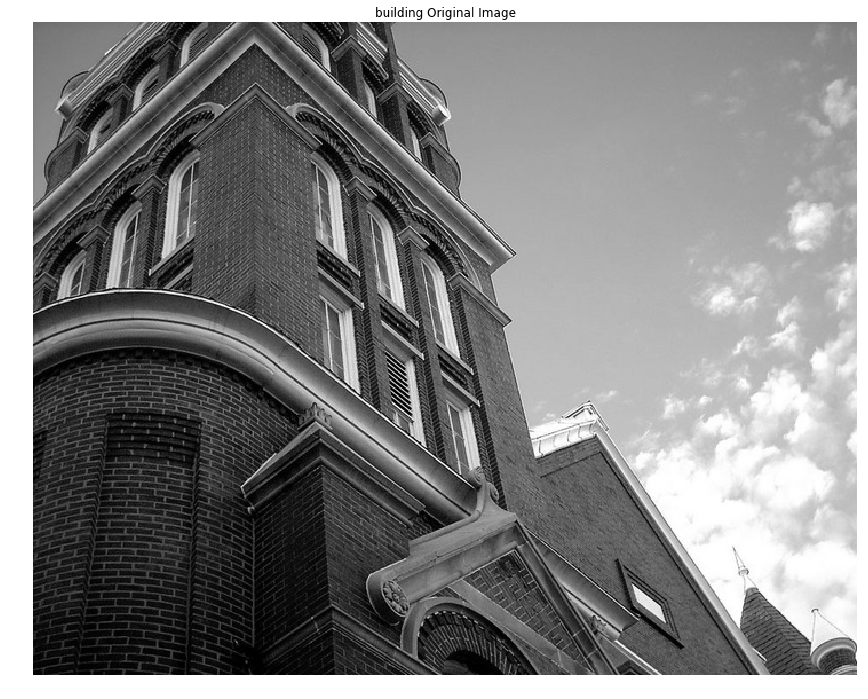

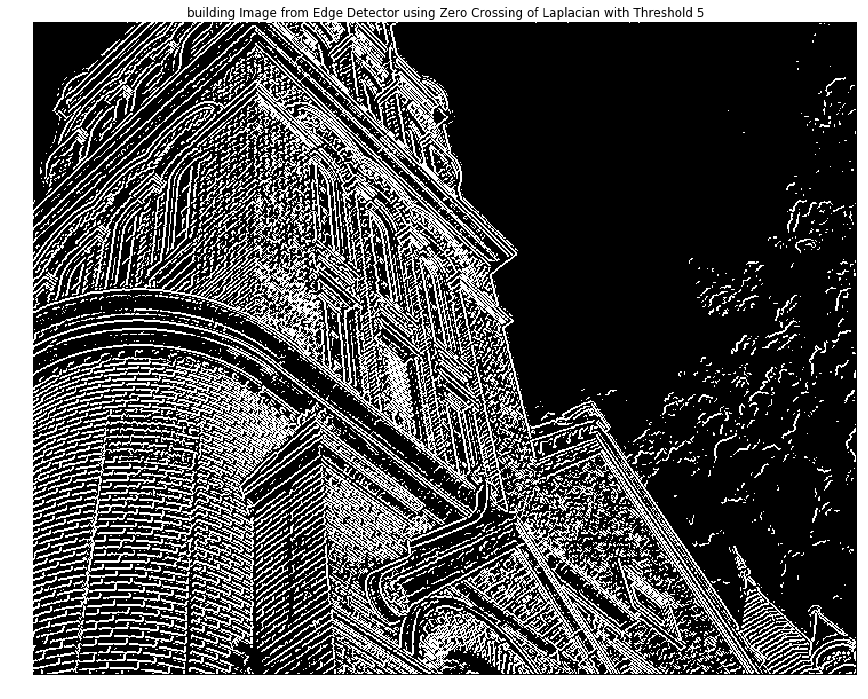

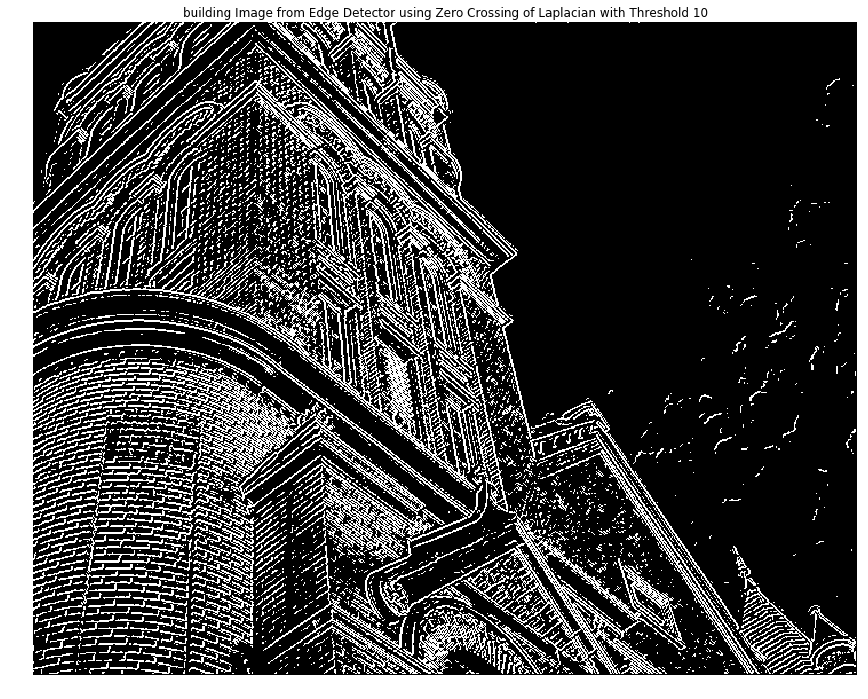

In [149]:
# write your code for Problem 5 here

# Calculating the Kernel here
gaussian = getGaussianKernel(11,1)
# Getting the Laplacian of Gaussian
gaussianLaplacianKernel = cv2.filter2D(gaussian, -1, laplacianKernel)


# inputImg = the original input image
# threshold = the value of the threshold
# maxValue = the value which you want to put for the pixels that is greater than the threshold
def zeroCrossingEdgeDetector(inputImg, threshold, maxValue):
    
    # first apply the Laplacian of Gaussian Kernel
    img = cv2.filter2D(inputImg.astype(np.float32), -1, gaussianLaplacianKernel)    
    
    # getting the height and width of the image
    height, width = img.shape
    
    # creating a new array representing an image and initiating all the values as 0
    bi_img = np.zeros((height, width), dtype=np.uint8)
    
    # looping over the x and y of the image
    for x in xrange(height-1):
        for y in xrange(width-1):
            # TRUE if the left pixel is positive and right pixel is negative
            # OR if the upper pixel is positive and lower pixel is negative
            if ((img.item(x, y-1) > 0  and img.item(x, y+1)<0) or (img.item(x-1, y) > 0  and img.item(x+1,y)<0)):
                # TRUE if the difference the left and right pixels or upper and lower pixel is greater than the threshold
                if ((img.item(x-1, y) - img.item(x+1, y))>= threshold or (img.item(x, y-1) - (img.item(x, y+1))) >= threshold):
                    # set the value of the respective pixel with the maxValue provided
                    bi_img.itemset((x, y), maxValue)
    # return the images with edges got from zero crossings of the Laplacian
    return bi_img

# just add the images in this array that you want to loop over here
arr_img = ['building']

for x in arr_img:
    img = cv2.imread(x + '.bmp', 0)
    plt.figure(figsize=(54, 12))
    plt.imshow(img, 'gray')
    plt.title(x + ' Original Image')
    plt.axis("off")
    
    # Threshold of 5
    plt.figure(figsize=(54, 12))
    plt.imshow(zeroCrossingEdgeDetector(img, 5, 255), 'gray')
    plt.title(x + ' Image from Edge Detector using Zero Crossing of Laplacian with Threshold 5')
    plt.axis("off")
    
    # Threshold of 10
    plt.figure(figsize=(54, 12))
    plt.imshow(zeroCrossingEdgeDetector(img, 10, 255), 'gray')
    plt.title(x + ' Image from Edge Detector using Zero Crossing of Laplacian with Threshold 10')
    plt.axis("off")
    
    plt.show()

- **Problem 6 {35 pts}:** Implement in Python the first two steps of the Canny edge extraction algorithm: CANNY_ENHANCER(Gaussian filtering & finding magnitude and orientation of gradient) and NONMAX_SUPPRESSION. Apply these steps to all of the images then apply an appropriate threshold to the edge strength values to select what you think are the most important edges. Compare the outputs from the original images and the noisy ones. Also compare the outputs for images between the zero crossing and Canny detectors. Include your code and results in your Jupyter Notebook file.


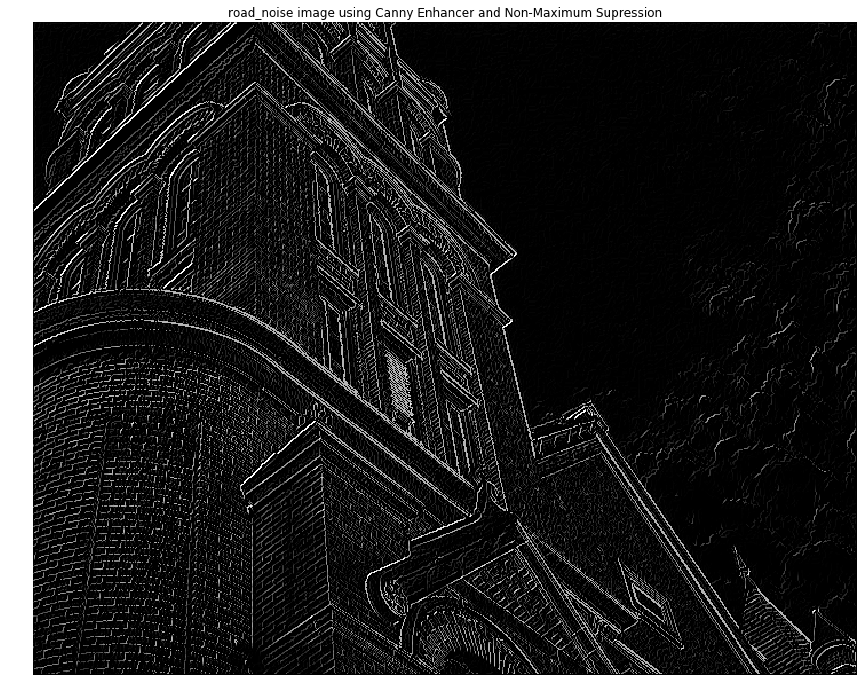

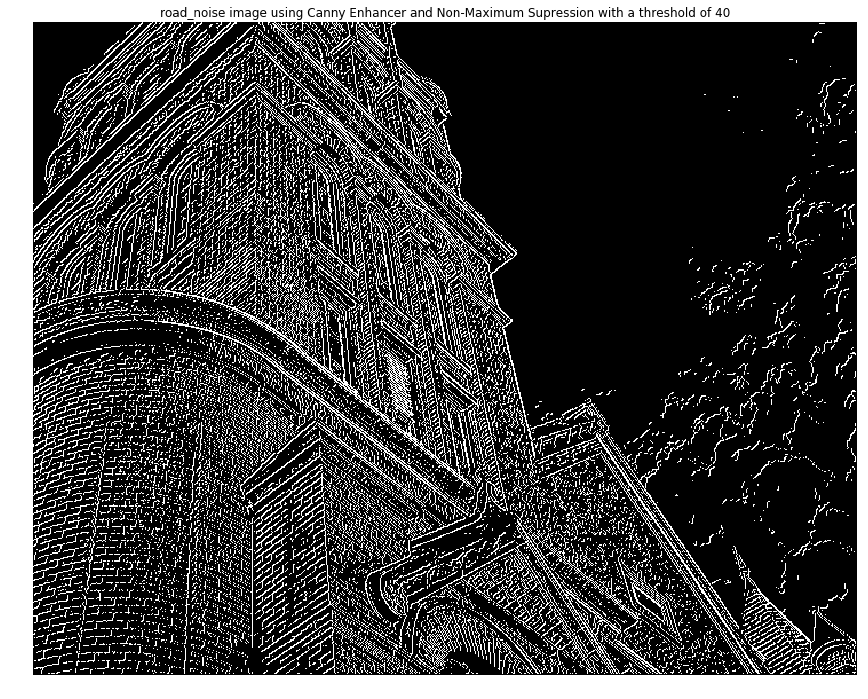

In [216]:
# write your code for Problem 6 here

# returns an img after applying Canny enhancer and nonmax-supression
def canny_Edge_Detector(img):
    # Applying the Gaussian Filter of width 5 and sigma 1
    gau_Img = cv2.filter2D(img, -1, getGaussianKernel(5, 1))
    
    # Finding the gradient using something similar to a Sobel
    # Creating the convolution masks in x and y directions
    convolution_X = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
    convolution_Y = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]])
    
    #print img.shape
    height, width = img.shape
    # Applying the convolutions
    xImg = cv2.filter2D(img, -1, convolution_X)
    yImg = cv2.filter2D(img, -1, convolution_Y)
    
    # Finding the magnitude
    mag_XY = np.sqrt(xImg.astype(np.float32)**2 + yImg.astype(np.float32)**2)
    
    # initialising all angles to 0
    angle_XY = np.zeros((height, width), dtype=np.float32)
    
    #initialising the output image array with 0
    outImg = np.zeros((height, width), dtype=np.float32)
    
    for i in xrange(height-1):
        for j in xrange(width-1):
            # making sure that arctan = 0 when x = 0
            # to avoid division by 0 error
            if (xImg[i][j]==0):
                x = 1
                y = 0
            else:
                x = xImg[i][j]
                y = yImg[i][j]
            
            # saving the angle values
            angle_XY[i][j] = np.arctan((y+0.0)/(x+0.0))/math.pi*180
            ang = angle_XY[i][j]
            
            # here we are finding the angle
            # we want to make sure that we take only the maximum value in the specific oriented gradient
            
            # if angle rounds to 0 then  we compare with (x,y-1) and (x,y+1)
            # if angle rounds to 45 then  we compare with (x-1,y-1) and (x+1,y+1)
            # if angle rounds to 90 then  we compare with (x-1,y) and (x+1,y)
            # if angle rounds to 135 then  we compare with (x+1,y-1) and (x-1,y+1)
            
            # rounding off the angles
            if ((ang >=0 and ang<=22.5) or (ang >=157.5 and ang<=180)):
                angle_XY[i][j] = 0
                # if the magnitude is greater than the up and down as angle = 0
                if (mag_XY[i][j]>=mag_XY[i][j-1] and mag_XY[i][j]>= mag_XY[i][j+1]):
                    outImg[i][j] = mag_XY[i][j]
            elif (ang >=22.5 and ang<=72.5):
                angle_XY[i][j] = 45
                # if the magnitude is greater than the top-left and bottom-right as angle = 45
                if (mag_XY[i][j]>=mag_XY[i-1][j-1] and mag_XY[i][j]>= mag_XY[i+1][j+1]):
                    outImg[i][j] = mag_XY[i][j]
            elif (ang >=72.5 and ang<=112.5):
                angle_XY[i][j] = 90
                # if the magnitude is greater than the left and right as angle = 90
                if (mag_XY[i][j]>=mag_XY[i-1][j] and mag_XY[i][j]>= mag_XY[i+1][j]):
                    outImg[i][j] = mag_XY[i][j]
            elif (ang >=112.5 and ang<157.5):
                angle_XY[i][j] = 135
                # if the magnitude is greater than the top-right and bottom-left as angle = 135
                if (mag_XY[i][j]>=mag_XY[i+1][j-1] and mag_XY[i][j]>= mag_XY[i-1][j+1]):
                    outImg[i][j] = mag_XY[i][j]
                    
    return outImg  # returning the img

# reading the image
img = cv2.imread('building.bmp', 0)
# applying the canny edge detector with enhancer and nonmax-supression
canny_Img = canny_Edge_Detector(img)

plt.figure(figsize=(54, 12))
plt.imshow(canny_Img, 'gray')
plt.title(x + ' image using Canny Enhancer and Non-Maximum Supression')
plt.axis("off")

plt.figure(figsize=(54, 12))
plt.imshow(imThreshold(canny_Img, 40,255), 'gray')
plt.title(x + ' image using Canny Enhancer and Non-Maximum Supression with a threshold of 40')
plt.axis("off")
plt.show()



- **Problem 7 {15 pts extra credit}:** Implement in Python the third step of the Canny algorithm HYSTERESIS_THRESH. Select two appropriate thresholds for the road and road_noise image, assuming that you would want to use the results in a self driving car application. Include your code and results in your Jupyter Notebook file.

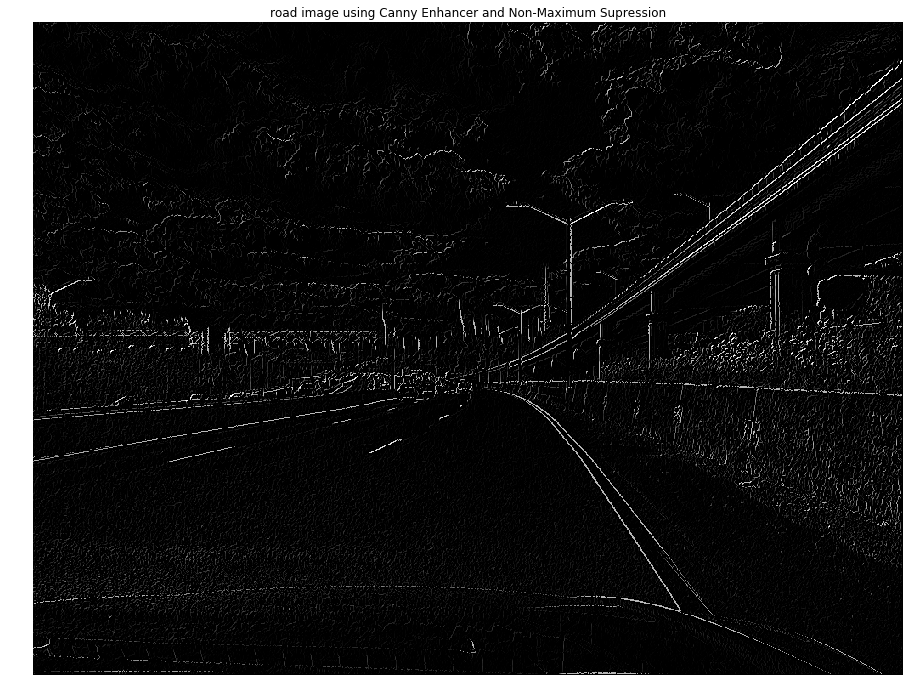

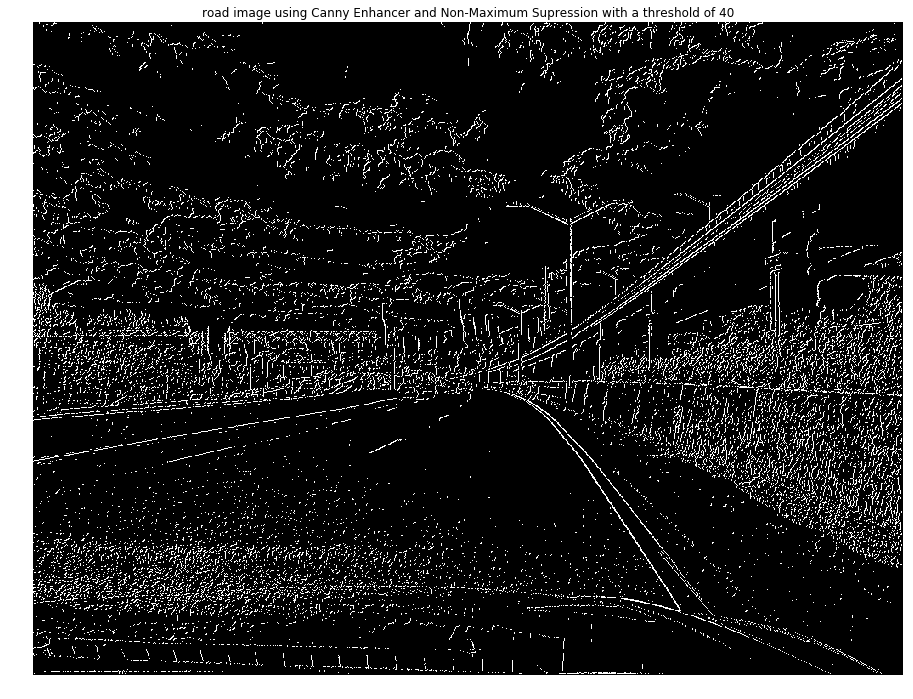

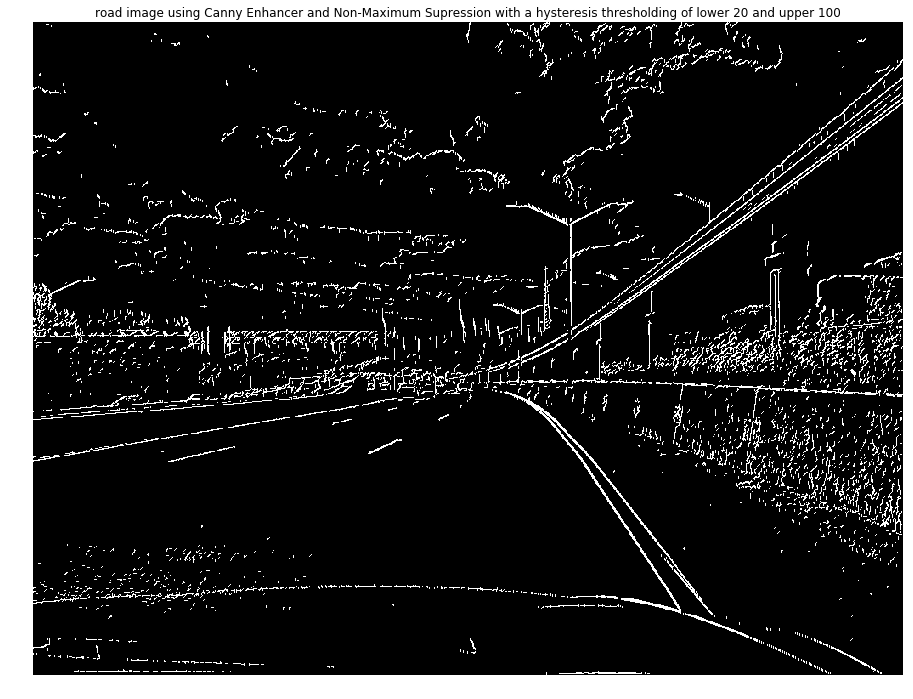

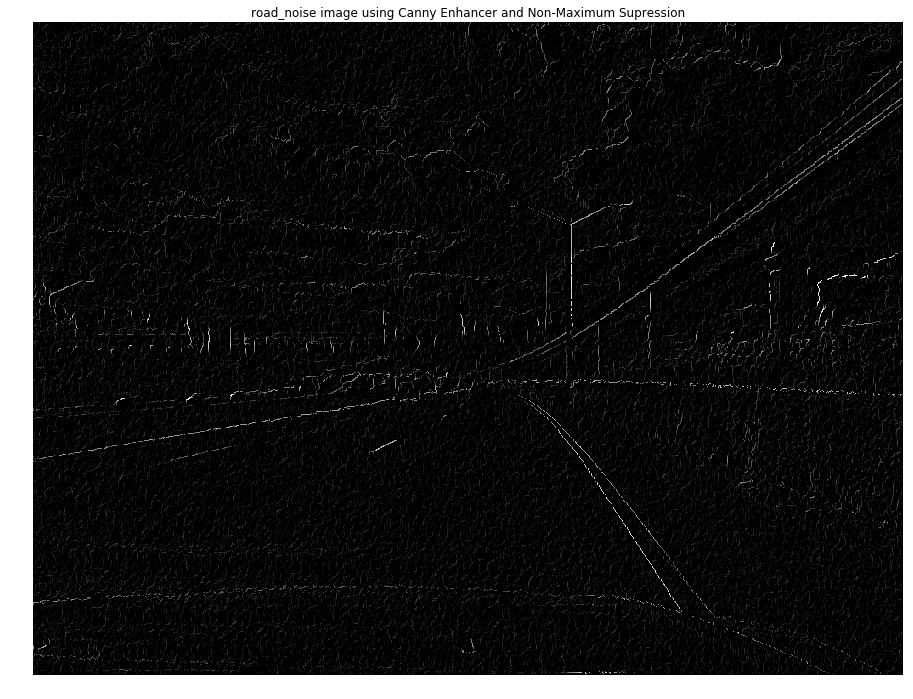

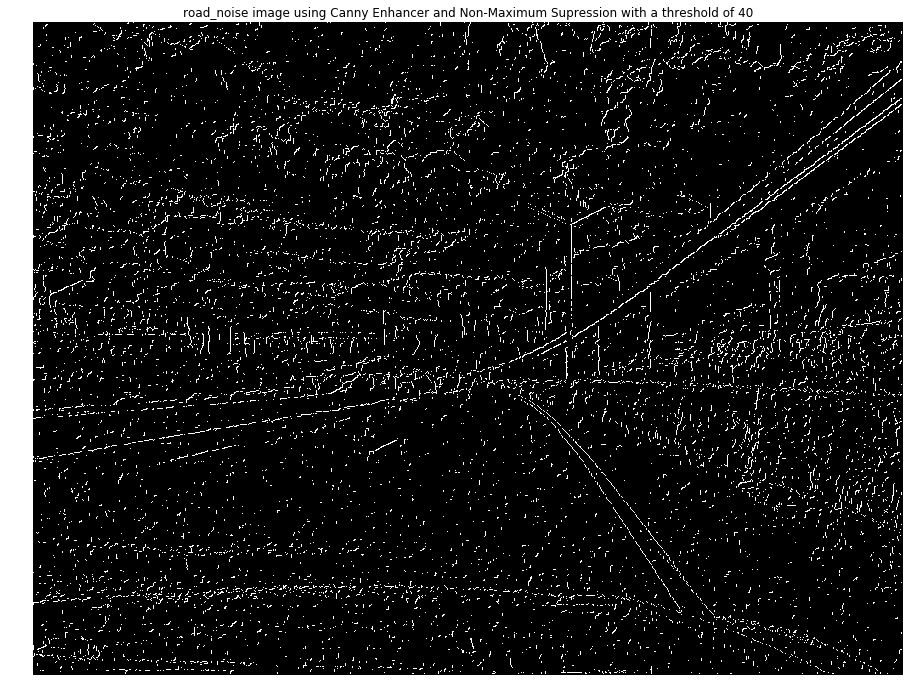

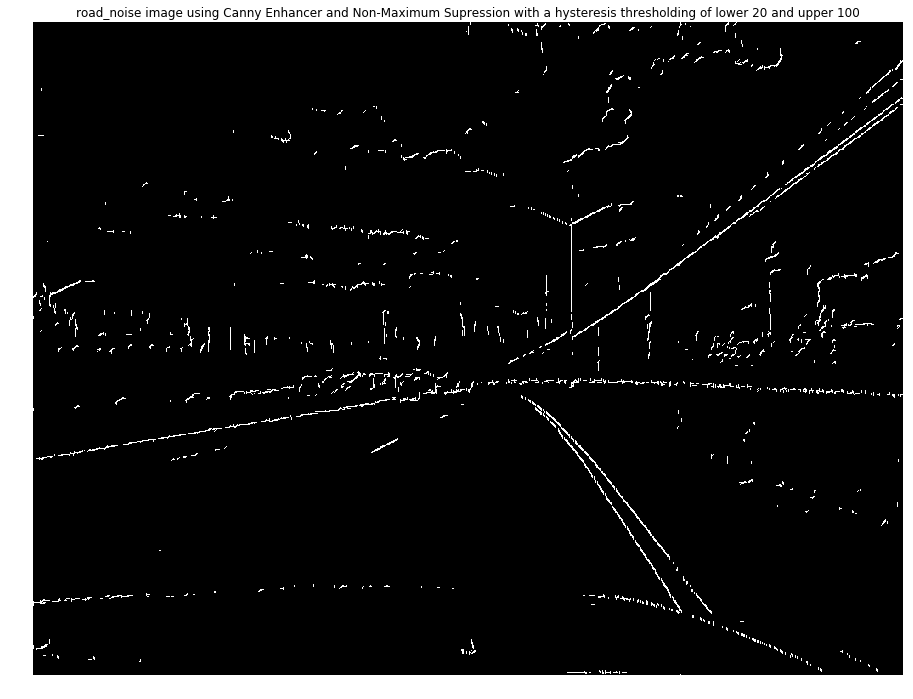

In [218]:
# The self driving car will crash after this code


# write your code for Problem 6 here

# returns an img after applying Canny enhancer, nonmax-supression and hysteresis thresholding
def canny_Edge(img, lowerThreshold, upperThreshold, maxValue):
    # Applying the Gaussian Filter of width 5 and sigma 1
    gau_Img = cv2.filter2D(img, -1, getGaussianKernel(5, 1))
    
    # Finding the gradient using something similar to a Sobel
    # Creating the convolution masks in x and y directions
    convolution_X = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
    convolution_Y = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]])
    
    #print img.shape
    height, width = img.shape
    # Applying the convolutions
    xImg = cv2.filter2D(img, -1, convolution_X)
    yImg = cv2.filter2D(img, -1, convolution_Y)
    
    # Finding the magnitude
    mag_XY = np.sqrt(xImg.astype(np.float32)**2 + yImg.astype(np.float32)**2)
    
    # initialising all angles to 0
    angle_XY = np.zeros((height, width), dtype=np.float32)
    
    #initialising the output image array with 0
    outImg = np.zeros((height, width), dtype=np.float32)
    
    for i in xrange(height-1):
        for j in xrange(width-1):
            # making sure that arctan = 0 when x = 0
            # to avoid division by 0 error
            if (xImg[i][j]==0):
                x = 1
                y = 0
            else:
                x = xImg[i][j]
                y = yImg[i][j]
            
            # saving the angle values
            angle_XY[i][j] = np.arctan((y+0.0)/(x+0.0))/math.pi*180
            ang = angle_XY[i][j]
            
            # here we are finding the angle
            # we want to make sure that we take only the maximum value in the specific oriented gradient
            
            # if angle rounds to 0 then  we compare with (x,y-1) and (x,y+1)
            # if angle rounds to 45 then  we compare with (x-1,y-1) and (x+1,y+1)
            # if angle rounds to 90 then  we compare with (x-1,y) and (x+1,y)
            # if angle rounds to 135 then  we compare with (x+1,y-1) and (x-1,y+1)
            
            # rounding off the angles
            if (mag_XY[i][j]>=upperThreshold):
                if ((ang >=0 and ang<=22.5) or (ang >=157.5 and ang<=180)):
                    angle_XY[i][j] = 0
                    # if the magnitude is greater than the up and down as angle = 0
                    if (mag_XY[i][j]>=mag_XY[i][j-1] and mag_XY[i][j]>= mag_XY[i][j+1]):
                        outImg[i][j] = maxValue
                        # connecting the neighbourhood pixels which are beside it
                        if (mag_XY[i-1][j]>= lowerThreshold):
                            outImg[i-1][j] = maxValue
                        if (mag_XY[i+1][j]>= lowerThreshold):
                            outImg[i+1][j] = maxValue
                            
                elif (ang >=22.5 and ang<=72.5):
                    angle_XY[i][j] = 45
                    # if the magnitude is greater than the top-left and bottom-right as angle = 45
                    if (mag_XY[i][j]>=mag_XY[i-1][j-1] and mag_XY[i][j]>= mag_XY[i+1][j+1]):
                        outImg[i][j] = maxValue
                        # connecting the neighbourhood pixels which are beside it
                        
                        if (mag_XY[i-1][j+1]>= lowerThreshold):
                            outImg[i-1][j+1] = maxValue
                        if (mag_XY[i+1][j-1]>= lowerThreshold):
                            outImg[i+1][j-1] = maxValue
                            
                elif (ang >=72.5 and ang<=112.5):
                    angle_XY[i][j] = 90
                    # if the magnitude is greater than the left and right as angle = 90
                    if (mag_XY[i][j]>=mag_XY[i-1][j] and mag_XY[i][j]>= mag_XY[i+1][j]):
                        outImg[i][j] = maxValue
                        
                        # connecting the neighbourhood pixels which are beside it
                        if (mag_XY[i][j-1]>= lowerThreshold):
                            outImg[i][j-1] = maxValue
                        if (mag_XY[i][j+1]>= lowerThreshold):
                            outImg[i][j+1] = maxValue
                            
                elif (ang >=112.5 and ang<157.5):
                    angle_XY[i][j] = 135
                    # if the magnitude is greater than the top-right and bottom-left as angle = 135
                    if (mag_XY[i][j]>=mag_XY[i+1][j-1] and mag_XY[i][j]>= mag_XY[i-1][j+1]):
                        outImg[i][j] = maxValue
                        
                        # connecting the neighbourhood pixels which are beside it
                        if (mag_XY[i-1][j-1]>= lowerThreshold):
                            outImg[i-1][j-1] = maxValue
                        if (mag_XY[i+1][j+1]>= lowerThreshold):
                            outImg[i+1][j+1] = maxValue
                    
    return outImg  # returning the img

# reading the image through a loop
x = 'road'
img = cv2.imread(x + '.bmp', 0)
# applying the canny edge detector with enhancer, nonmax-supression and hysteresis thresholding
canny_Img = canny_Edge_Detector(img)
canny_Img2 = canny_Edge(img, 20,100,255)

plt.figure(figsize=(54, 12))
plt.imshow(canny_Img, 'gray')
plt.title(x + ' image using Canny Enhancer and Non-Maximum Supression')
plt.axis("off")
plt.show()

plt.figure(figsize=(54, 12))
plt.imshow(imThreshold(canny_Img,40,255), 'gray')
plt.title(x + ' image using Canny Enhancer and Non-Maximum Supression with a threshold of 40')
plt.axis("off")
plt.show()

plt.figure(figsize=(54, 12))
plt.imshow(canny_Img2, 'gray')
plt.title(x + ' image using Canny Enhancer and Non-Maximum Supression with a hysteresis thresholding of lower 20 and upper 100')
plt.axis("off")
plt.show()


# Here the image has been blurred first to smooth the image
# to do that, a gaussian filter of 5 width and 3 sigma is applied
x = 'road_noise'
img_noise = cv2.imread('road_noise.bmp', 0)
img = cv2.filter2D(img_noise, -1,getGaussianKernel(5,3))
# applying the canny edge detector with enhancer, nonmax-supression and hysteresis thresholding
canny_Img = canny_Edge_Detector(img)
canny_Img2 = canny_Edge(img,20,100,255)

plt.figure(figsize=(54, 12))
plt.imshow(canny_Img, 'gray')
plt.title(x + ' image using Canny Enhancer and Non-Maximum Supression')
plt.axis("off")
plt.show()

plt.figure(figsize=(54, 12))
plt.imshow(imThreshold(canny_Img,40,255), 'gray')
plt.title(x + ' image using Canny Enhancer and Non-Maximum Supression with a threshold of 40')
plt.axis("off")
plt.show()

plt.figure(figsize=(54, 12))
plt.imshow(canny_Img2, 'gray')
plt.title(x + ' image using Canny Enhancer and Non-Maximum Supression with a hysteresis thresholding of lower 20 and upper 100')
plt.axis("off")
plt.show()


## Submission
---
Submission will be via Blackboard. The only file you need to submit is this .ipynb notebook file with your answers. **NO** need to submit the resulting images separately.